# Segmentation of brain tumor regions

In this notebook, we'll implement a 3-dimensional UNet image segmentation model in order to predict brain tumor regions from MRI scan data.

We'll use the Training dataset from the 2020 BraTS (Brain Tumor Segmentation) Challenge, which ran in conjunction with the 23rd annual International Conference on Medical Image Computing & Computer Assisted Intervention (MICCAI).

Each sample in the dataset consists of 3-dimensional MRI images for native (T1), post-contrast T1-weighted (T1-CE), T2-weighted (T2), T2 Fluid Attenuated Inversion Recovery (T2-FLAIR) volumes as well as a ground truth segmentation mask indicating a class label for each voxel.  For our study, we omit T1 and only use T1-CE, T2, and FLAIR channels.

For more information about the challenge and the dataset, please visit the [BraTS 2020 website.](https://www.med.upenn.edu/cbica/brats2020/)

### Preparation and pre-processing

#### Import necessary packages

In [2]:
import numpy as np
import os
import glob
from tqdm.auto import tqdm
import random
from IPython.display import HTML
import torch
import matplotlib.pyplot as plt
import pickle
import pandas as pd

random_seed = 42

# A useful function for re-seeding all pseudorandom generators
def set_seed(seed = random_seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)

#### List filenames

**Before proceeding, make sure you have already:**
1. Acquired the BraTS 2020 dataset, e.g. as a .zip file from [this Kaggle dataset item](https://www.kaggle.com/datasets/awsaf49/brats20-dataset-training-validation).
2. Unzipped the file and placed the directory ``BraTS2020_TrainingData`` in the same directory as this notebook.  We will not use the samples in ``BraTS2020_ValidationData`` as segmentation masks (i.e. targets) are not available for these samples - they were held internally in the BraTS system for online validation.

In [2]:
# DATA_PATH = 'BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'

# mask_filenames = sorted(glob.glob(DATA_PATH+'*/*seg.nii'))
# path_prefixes = [f.replace('seg.nii','') for f in mask_filenames]

#### Preprocess and save images and masks as .npy files

The following block of code preprocesses the samples from the ``BraTS2020_TrainingData`` directory and saves preprocessed files as Numpy arrays.  Later, our Pytorch DataLoaders will load data from these arrays.

After initial cropping, each segmentation mask will have shape (160,192,128) and its entries take values in {0,1,2,3} which stand for the following:
* 0 for an unlabelled voxel
* 1 for the label NCR/NET (nectrotic and non-enhancing tumor core)
* 2 for the label ED (peritumoral edema)
* 3 (originally 4) for the label ET (enhancing tumor)

We'll train our network for a common segmentation task in this domain which consists of delineating the following three semantically meaningful tumor parts:
* The ET region, i.e. label 3 above
* The TC (tumor core) region, i.e the union of labels 1 and 3 above
* The WT (whole tumor) region, i.e. the union of labels 1, 2, 3 above

We use a function ``encode_mask`` to encode an original mask of shape (160,192,128) to an encoded binary mask of shape (3,160,192,128) where the three binary entries of the vector ``encoded_mask[:,i,j,k]`` indicate whether the voxel (i,j,k) from the original mask is classified as ET, TC, WT respectively.  Note that with these labels we are considering a multi-class classification problem - e.g. if a voxel originally had label 1, then its vector in this encoded mask is (0,1,1).

The original mask can be recovered using the ``decode_mask`` function.

So we'll do the following:
1. Load each mask as a numpy array of shape (240,240,155) and a corresponding stacked image of shape (3,240,240,155) whose three channels consists of T1-CE, T2, and FLAIR images.  Note that stacked images have channels normalized to take values between 0 and 1 using min-max scaling.
2. Crop each image and mask pair to remove as large a border of blank voxels as we can.
3. Symmetrically 0-pad each image and mask pair spatial dimensions upto the next multiple of 16 (concatenation in our UNet is simplest, i.e. doesn't require cropping on the skip connection portion, when all spatial dimensions are divisible by 2^4=16)
4. Save the images and encoded masks to disk.  Warning: this collection of files requires about 33GB of disk space.  You can try to scale down the images or crop differently to reduce this filesize burden.

In [3]:
# from lib.image_utils import get_mask, encode_mask, get_stacked_image,pad_crop_to_size, crop_border
# counter = 0
# shapes = {}
# for prefix in tqdm(path_prefixes):
#     # Load mask and stacked image
#     mask = get_mask(prefix)
#     image = get_stacked_image(prefix)

#     # Remove border of zeros, and use 0-padding
#     # to round all physical dimensions upto next
#     # multiple of 16
#     image,mask = crop_border(image,mask)
#     image,mask = pad_crop_to_size(image,mask)
#     shape = image.shape
#     if (shape[1] > 160)|(shape[2] > 192)|(shape[3] > 160):
#         print(f'Image {counter} shape: {shape}')
#         shapes[counter] = shape
    
#     # Each mask has entries in {0,1,2,3}.  For a mask with
#     # shape (H,W,D), one-hot-encode to shape (3,H,W,D)
#     # with corresponding to labels ET, TC, WT 
#     mask = encode_mask(mask)
#     np.save(f'masks/mask_{counter}.npy',mask)
#     np.save(f'images/image_{counter}.npy',image)
#     counter += 1

Image 339 has a reasonable shape, but visual inspection reveals that image 340 has erroneous nonzero voxels near the edges.  Manually crop that one down to shape ``(3,144,160,144)``.

In [4]:
# image = np.load('images/image_340.npy')
# mask = np.load('masks/mask_340.npy')
# image = image[:,46:190,47:207,:]
# mask = mask[:,46:190,47:207,:]
# np.save('images/image_340.npy',image)
# np.save('masks/mask_340.npy',mask)

### Visualize some samples

Now that we've saved images and masks from samples as Numpy arrays, we visually inspect some samples.

In [5]:
import matplotlib.animation as animation
from lib.plot import plot_sample, animate_sample
from lib.image_utils import decode_mask

#### Look at a random slice of a random image

The function ``plot_sample`` can be used to produce a figure consisting of subplots of T1-CE, T2, FLAIR, and segmentation mask at a specified axial slice ``[:,:,nslice]``

Note that we decode our masks before plotting, i.e. the color-coding in the segmentation mask plots represents the original segmentation labels 0 (unlabelled), 1 (NCR/NET), 2 (ED), 3 (ET).

Slice 92 out of 160:


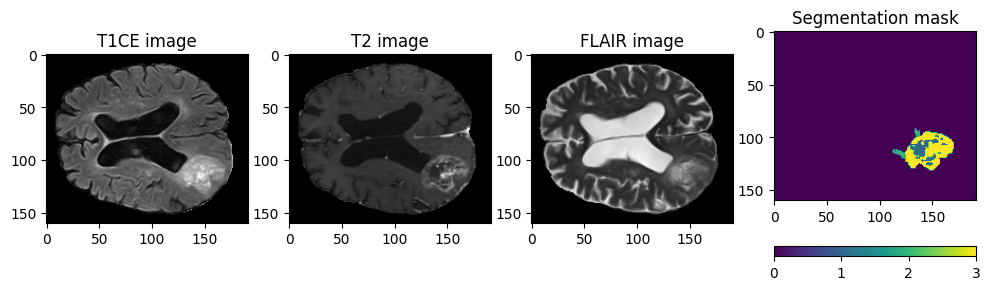

In [6]:
set_seed()

img_list = os.listdir('images')
idx = np.random.choice(len(img_list))

image = np.load(f'images/image_{idx}.npy')
mask = np.load(f'masks/mask_{idx}.npy')
mask = decode_mask(mask)

nslice = np.random.randint(0,mask.shape[2])

plot_sample(image,mask,nslice=nslice)

#### Animate a random sample over slices

The function ``animate_sample`` can be used to produce a figure consisting of subplots of T1-CE, T2, FLAIR, and segmentation mask which animates over the entire range of axial slices.

In [7]:
img_list = os.listdir('images')
idx = np.random.choice(len(img_list))

image = np.load(f'images/image_{idx}.npy')
mask = np.load(f'masks/mask_{idx}.npy')
mask = decode_mask(mask)

ani = animate_sample(image,mask)
HTML(ani.to_jshtml())

### Custom datasets, dataloaders



The custom ``torch.utils.data.Dataset`` MRIDataset uses filename prefixes to generate image,mask pairs.  Generated data is processed differently based on whether the Dataset will be used for training, validation, or testing:
* For training samples:
    * Images and masks will be randomly cropped to spatial shape no greater than ``(128,128,128)`` (note that some axes could already have shorter length due to prior border cropping).
    * Images and masks will have spatial axes randomly flipped (each axis flipped independently with probability 0.5).
    * Images will have Gaussian noise added with probability 0.8, where the noise has mean 0 and variance equal to 0.1 times the variance of the image intensity.
    * Image,mask sample pairs will be duplicated by a factor of the parameter ``train_dupe_factor`` (and duplications will have independent random cropping, flipping, noising as above), i.e. each sample pair will generate ``train_dupe_factor`` elements of the dataset.  This training data augmentation is intended to reduce overfitting during training.
* For validation/testing samples, the image, mask sample pairs will not be padded or cropped beyond the initial preprocessing stage already performed when saving .npy files (i.e. border cropping and padding spatial dimensions to multiples of 16). Because these samples can have different spatial dimensions, validation and testing dataloaders will have a batch size of 1.  One can experiment with larger validation/testing batch size by implementing per-batch padding or cropping if desired, but that is not implemented here.  There are two methods we tried for inference and evaluation:
    * Duplication with TTA:
        * Image samples will be duplicated by a factor of the parameter ``valid_dupe_factor`` (and duplications will have independent flipping, noising as above) in order to implement test-time augmentation (TTA); the model will produce predicted masks for all augmentations of a given sample image, and then the logits will be averaged for the final prediction.  TTA tends to preduce higher quality predictions achieving better metrics.
        * Since validation/testing predictions will depend on all augmentations of an image, they are not split up into different dataset elements but rather stacked.  Masks are not duplicated or stacked - rather, for each image of shape ``(3,H,W,D)`` and its corresponding one-hot-encoded mask of shape ``(3,H,W,D)``, the testing/validation dataset will associate:
            * A tensor ``image`` of shape ``(valid_dupe_factor,3,H,W,D)`` which is a stack of all augmentations
            * A one-hot-encoded ``mask`` tensor of shape ``(3,H,W,D)``
            * ``do_flips``, an item of type ``list(list(bool))`` where ``do_flips[i][j]`` indicates whether axis ``j`` of augmentation ``i`` was flipped - this data is needed in order to unflip prior to averageing predictions during TTA.
       * Chunking into patches as a form of TTA:
           * Each image sample of shape (3,H,W,D) will be chunked into eight overlapping patches of spatial shape (128,128,128) and batched to form an array of shape (8,3,128,128,128).  Each of the patches is randomly axis-flipped along each axis.
           * Overlap widths on each axis are necessary to store in order to recover the original image, as are the do_flips list as above.  After prediction is done on the batch, each predicted patch is unflipped and predictions are recombined into shape (3,H,W,D) - with mean of predictions used on the overlap voxels.
           * Since much of the image is contained in the overlaps, we are producing many augmented predictions - which serves as a form of TTA.
           
The patching/chunking with axis flips produced higher scoring predictions, so we choose that method.

In [17]:
from lib.data import *

set_seed()
from lib.data import MRIDataset
from sklearn.model_selection import train_test_split

paths = os.listdir('images')
paths.sort()

train_batch_size = 12
valid_batch_size = 1
train_dupe_factor = 12
valid_dupe_factor = 1
noise_prob = 0.8

# Split into training (60%), validation (20%), and test (20%) sets
train_paths, valid_paths = train_test_split(
    paths,shuffle=True, test_size=0.2, random_state=random_seed
)

train_paths, test_paths = train_test_split(
    train_paths, shuffle=True, test_size = 0.25, random_state = random_seed
)

train_dl = get_dl(train_paths, training = True, batch_size = train_batch_size, dupe_factor = train_dupe_factor)
valid_dl = get_dl(valid_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)
test_dl = get_dl(test_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)

### Initialize 3-dimensional UNet model

The parameter ``init_features`` is the number of features in the first encoder convolution layer of the UNet, and each successive encoder layer has double the number of features. This parameter can be reduced for a leaner (but less expressive) model.

In [19]:
from lib.unet import UNet

out_channels = 3

model = UNet(dim=3, out_channels = out_channels, init_features=16, num_stages=4)

### Initialize metrics, optimizer, loss function, and training Accelerator

* Our loss function during training will be ``monai.losses.DiceFocalLoss``, which is a sum of the Focal loss (an improved version of the cross-entropy loss which helps with class imbalance) and the Dice loss (originating from the Sørensen–Dice coefficient).
* Recall that due to our shift from the original segmentation labels (0,1,2,3) to the labels (ET,TC,WT), we arrive at a multilabel classification problem for each voxel - for example, a voxel which was originally classified with label 1 (NCR/NET) gets assigned with both TC and WT labels. For evaluating model performance, we will use the multilabel Dice similarity metric, also known as the multilabel F1-score and available in ``torchmetrics`` as ``MultilabelF1Score``.
* We compute separate metrics for each label ET,TC,WT - so we can keep track of how to the model is doing on various types of tumor regions.
* We will use the Ranger21 optimizer presented in [this paper](https://arxiv.org/abs/2106.13731) and implemented by one of the authors in [this repository](https://github.com/lessw2020/Ranger21).  Ranger21 uses the AdamW optimizer at its core, but has a host of additional built-in features that (based on experiments so far) tend to provide improved performance and convergence speed over the original AdamW.
* We train for 60 epochs with a maximum learning rate of 3e-3.  Due to Paperspace notebook time limit constraints, we train in three sessions which together amount to the 'explore-exploit' learning rate schedule used in Ranger21.  On each run, we set a different random seed.
    * For 20 epochs with a linear LR warmup upto 3e-3
    * For 20 epochs with a constants LR of 3e-3
    * For 20 epochs with a linear LR warmdown from 3e-3 to below 3e-5
* We will use the 🤗 accelerators library to handle our GPU during training.

In [21]:
num_training_epochs = 20
learning_rate = 3e-3
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'

from accelerate import Accelerator
from ranger21 import Ranger21

from monai.losses import DiceFocalLoss
from torchmetrics.classification import MultilabelF1Score
loss_fn = DiceFocalLoss(sigmoid=True)
dice = MultilabelF1Score(num_labels=3,average='none')

num_update_steps_per_epoch = len(train_dl)
num_training_steps = num_training_epochs*num_update_steps_per_epoch

optimizer = Ranger21(model.parameters(),lr=learning_rate,
                     num_epochs = num_training_epochs,
                    num_batches_per_epoch = num_update_steps_per_epoch,
                    warmdown_active=False,
                     # use_warmup = False,
                    )
accelerator = Accelerator(mixed_precision = 'fp16')
model, optimizer, train_dl, valid_dl, dice = accelerator.prepare(
    model, optimizer, train_dl, valid_dl, dice
)
dls = (train_dl, valid_dl)

Ranger21 optimizer ready with following settings:

Core optimizer = AdamW
Learning rate of 0.003

Important - num_epochs of training = ** 20 epochs **
please confirm this is correct or warmup and warmdown will be off

Warm-up: linear warmup, over 972 iterations

Lookahead active, merging every 5 steps, with blend factor of 0.5
Norm Loss active, factor = 0.0001
Stable weight decay of 0.0001
Gradient Centralization = On

Adaptive Gradient Clipping = True
	clipping value of 0.01
	steps for clipping = 0.001


### Training

Evaluation time is non-trivial due to the test-time augmentation step.  To cut down on the amount of time spent evaluating, we only perform the evaluation step during the first epoch, the last five epochs, and epochs between which are multiples of five.  Upon finishing evaluation, the training loop reports training loss, evaluation loss, and IoU and Dice metrics for all class labels.

#### Run 1 - 20 epochs with warmup

In [22]:
from lib.train import *

model, loss_hist_train, loss_hist_val, metrics_hist_val = train(model, dls, optimizer, accelerator, loss_fn, dice, num_training_epochs = num_training_epochs)

  0%|          | 0/4420 [00:00<?, ?it/s]

params size saved
total param groups = 1
total params in groups = 64
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 1 ----- training loss: 1.0766 ----- validation loss: 1.0270 
         ----- Avg  Dice: 0.2284 
         ----- ET   Dice: 0.1294 
         ----- TC   Dice: 0.1780 
         ----- WT   Dice: 0.3779 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 2 ----- training loss: 0.9723 ----- validation loss: 0.9463 
         ----- Avg  Dice: 0.5975 
         ----- ET   Dice: 0.4801 
         ----- TC   Dice: 0.5583 
         ----- WT   Dice: 0.7541 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 3 ----- training loss: 0.8842 ----- validation loss: 0.8537 
         ----- Avg  Dice: 0.4487 
         ----- ET   Dice: 0.3262 
         ----- TC   Dice: 0.3633 
         ----- WT   Dice: 0.6568 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 4 ----- training loss: 0.7449 ----- validation loss: 0.6326 
         ----- Avg  Dice: 0.6380 
         ----- ET   Dice: 0.5375 
         ----- TC   Dice: 0.5899 
         ----- WT   Dice: 0.7866 

** Ranger21 update = Warmup complete - lr set to 0.003

Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 5 ----- training loss: 0.5612 ----- validation loss: 0.4169 
         ----- Avg  Dice: 0.6826 
         ----- ET   Dice: 0.5772 
         ----- TC   Dice: 0.6385 
         ----- WT   Dice: 0.8322 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 6 ----- training loss: 0.4316 ----- validation loss: 0.5302 
         ----- Avg  Dice: 0.5496 
         ----- ET   Dice: 0.3900 
         ----- TC   Dice: 0.4709 
         ----- WT   Dice: 0.7880 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 7 ----- training loss: 0.3696 ----- validation loss: 0.3062 
         ----- Avg  Dice: 0.7316 
         ----- ET   Dice: 0.6318 
         ----- TC   Dice: 0.7474 
         ----- WT   Dice: 0.8155 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 8 ----- training loss: 0.3406 ----- validation loss: 0.4238 
         ----- Avg  Dice: 0.6220 
         ----- ET   Dice: 0.5112 
         ----- TC   Dice: 0.5536 
         ----- WT   Dice: 0.8012 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 9 ----- training loss: 0.3106 ----- validation loss: 0.2725 
         ----- Avg  Dice: 0.7572 
         ----- ET   Dice: 0.6558 
         ----- TC   Dice: 0.7789 
         ----- WT   Dice: 0.8368 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 10 ----- training loss: 0.2965 ----- validation loss: 0.2644 
         ----- Avg  Dice: 0.7674 
         ----- ET   Dice: 0.6712 
         ----- TC   Dice: 0.8036 
         ----- WT   Dice: 0.8275 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 11 ----- training loss: 0.2775 ----- validation loss: 0.2664 
         ----- Avg  Dice: 0.7632 
         ----- ET   Dice: 0.6673 
         ----- TC   Dice: 0.7783 
         ----- WT   Dice: 0.8440 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 12 ----- training loss: 0.2629 ----- validation loss: 0.3129 
         ----- Avg  Dice: 0.7216 
         ----- ET   Dice: 0.5990 
         ----- TC   Dice: 0.7612 
         ----- WT   Dice: 0.8046 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 13 ----- training loss: 0.2544 ----- validation loss: 0.2490 
         ----- Avg  Dice: 0.7772 
         ----- ET   Dice: 0.6755 
         ----- TC   Dice: 0.7994 
         ----- WT   Dice: 0.8567 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 14 ----- training loss: 0.2438 ----- validation loss: 0.2689 
         ----- Avg  Dice: 0.7635 
         ----- ET   Dice: 0.6668 
         ----- TC   Dice: 0.7926 
         ----- WT   Dice: 0.8313 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 15 ----- training loss: 0.2336 ----- validation loss: 0.2363 
         ----- Avg  Dice: 0.7884 
         ----- ET   Dice: 0.6799 
         ----- TC   Dice: 0.8345 
         ----- WT   Dice: 0.8507 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 16 ----- training loss: 0.2313 ----- validation loss: 0.2408 
         ----- Avg  Dice: 0.7844 
         ----- ET   Dice: 0.6893 
         ----- TC   Dice: 0.8028 
         ----- WT   Dice: 0.8610 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 17 ----- training loss: 0.2262 ----- validation loss: 0.3080 
         ----- Avg  Dice: 0.7260 
         ----- ET   Dice: 0.6324 
         ----- TC   Dice: 0.7186 
         ----- WT   Dice: 0.8269 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 18 ----- training loss: 0.2208 ----- validation loss: 0.2278 
         ----- Avg  Dice: 0.7958 
         ----- ET   Dice: 0.6956 
         ----- TC   Dice: 0.8410 
         ----- WT   Dice: 0.8507 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 19 ----- training loss: 0.2113 ----- validation loss: 0.2392 
         ----- Avg  Dice: 0.7858 
         ----- ET   Dice: 0.6874 
         ----- TC   Dice: 0.8409 
         ----- WT   Dice: 0.8291 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 20 ----- training loss: 0.2123 ----- validation loss: 0.2946 
         ----- Avg  Dice: 0.7408 
         ----- ET   Dice: 0.6854 
         ----- TC   Dice: 0.7024 
         ----- WT   Dice: 0.8346 


In [23]:
model_prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1'

torch.save(model.state_dict(),model_prefix+'_weights.pth')
with open(model_prefix+'_split_info.pkl','wb') as f:
    pickle.dump([train_paths,valid_paths,test_paths],f)
with open(model_prefix+'_results.pkl', 'wb') as f:
    pickle.dump([metrics_hist_val, loss_hist_train, loss_hist_val], f)

#### Run 2 - 20 epochs

In [3]:
model_prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1'
with open(model_prefix+'_split_info.pkl','rb') as f:
    train_paths, valid_paths, test_paths = pickle.load(f)
    
from lib.unet import UNet

out_channels = 3

model = UNet(dim=3, out_channels = out_channels, init_features=16, num_stages=4)
model.load_state_dict(torch.load(model_prefix+'_weights.pth'))

from lib.data import *

set_seed(10)
from lib.data import MRIDataset

train_batch_size = 12
valid_batch_size = 1
train_dupe_factor = 12
valid_dupe_factor = 4
noise_prob = 0.8

train_dl = get_dl(train_paths, training = True, batch_size = train_batch_size, dupe_factor = train_dupe_factor)
valid_dl = get_dl(valid_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)
test_dl = get_dl(test_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)

num_training_epochs = 20
learning_rate = 3e-3
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'

from accelerate import Accelerator
from ranger21 import Ranger21

from monai.losses import DiceFocalLoss
from torchmetrics.classification import MultilabelJaccardIndex, MultilabelF1Score
loss_fn = DiceFocalLoss(sigmoid=True)
iou = MultilabelJaccardIndex(num_labels=3,average='none')
dice = MultilabelF1Score(num_labels=3,average='none')

num_update_steps_per_epoch = len(train_dl)
num_training_steps = num_training_epochs*num_update_steps_per_epoch

optimizer = Ranger21(model.parameters(),lr=learning_rate,
                     num_epochs = num_training_epochs,
                    num_batches_per_epoch = num_update_steps_per_epoch,
                    warmdown_active=False,use_warmup=False,
                    )
accelerator = Accelerator(mixed_precision = 'fp16')
model, optimizer, train_dl, valid_dl, iou, dice = accelerator.prepare(
    model, optimizer, train_dl, valid_dl, iou, dice
)
dls = (train_dl, valid_dl)

In [8]:
from lib.train import *

model, loss_hist_train, loss_hist_val, metrics_hist_val = train(model, dls, optimizer, accelerator, loss_fn, dice, num_training_epochs = num_training_epochs)

  0%|          | 0/4420 [00:00<?, ?it/s]

params size saved
total param groups = 1
total params in groups = 64
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 1 ----- training loss: 0.2063 ----- validation loss: 0.2549 
         ----- Avg  Dice: 0.7735 
         ----- ET   Dice: 0.6492 
         ----- TC   Dice: 0.8158 
         ----- WT   Dice: 0.8556 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 2 ----- training loss: 0.1992 ----- validation loss: 0.2327 
         ----- Avg  Dice: 0.7930 
         ----- ET   Dice: 0.6966 
         ----- TC   Dice: 0.8230 
         ----- WT   Dice: 0.8593 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 3 ----- training loss: 0.1962 ----- validation loss: 0.2431 
         ----- Avg  Dice: 0.7811 
         ----- ET   Dice: 0.6495 
         ----- TC   Dice: 0.8386 
         ----- WT   Dice: 0.8551 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 4 ----- training loss: 0.1975 ----- validation loss: 0.2139 
         ----- Avg  Dice: 0.8079 
         ----- ET   Dice: 0.6930 
         ----- TC   Dice: 0.8562 
         ----- WT   Dice: 0.8745 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 5 ----- training loss: 0.1917 ----- validation loss: 0.2138 
         ----- Avg  Dice: 0.8067 
         ----- ET   Dice: 0.6899 
         ----- TC   Dice: 0.8561 
         ----- WT   Dice: 0.8740 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 6 ----- training loss: 0.1890 ----- validation loss: 0.2544 
         ----- Avg  Dice: 0.7721 
         ----- ET   Dice: 0.6810 
         ----- TC   Dice: 0.7874 
         ----- WT   Dice: 0.8479 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 7 ----- training loss: 0.1878 ----- validation loss: 0.2252 
         ----- Avg  Dice: 0.7990 
         ----- ET   Dice: 0.6996 
         ----- TC   Dice: 0.8402 
         ----- WT   Dice: 0.8570 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 8 ----- training loss: 0.1855 ----- validation loss: 0.2479 
         ----- Avg  Dice: 0.7770 
         ----- ET   Dice: 0.6899 
         ----- TC   Dice: 0.7698 
         ----- WT   Dice: 0.8713 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 9 ----- training loss: 0.1812 ----- validation loss: 0.2174 
         ----- Avg  Dice: 0.8046 
         ----- ET   Dice: 0.6971 
         ----- TC   Dice: 0.8445 
         ----- WT   Dice: 0.8722 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 10 ----- training loss: 0.1819 ----- validation loss: 0.2087 
         ----- Avg  Dice: 0.8115 
         ----- ET   Dice: 0.7037 
         ----- TC   Dice: 0.8552 
         ----- WT   Dice: 0.8756 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 11 ----- training loss: 0.1785 ----- validation loss: 0.2235 
         ----- Avg  Dice: 0.7989 
         ----- ET   Dice: 0.6938 
         ----- TC   Dice: 0.8355 
         ----- WT   Dice: 0.8673 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 12 ----- training loss: 0.1787 ----- validation loss: 0.2292 
         ----- Avg  Dice: 0.7946 
         ----- ET   Dice: 0.7035 
         ----- TC   Dice: 0.8405 
         ----- WT   Dice: 0.8398 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 13 ----- training loss: 0.1748 ----- validation loss: 0.2104 
         ----- Avg  Dice: 0.8109 
         ----- ET   Dice: 0.7043 
         ----- TC   Dice: 0.8551 
         ----- WT   Dice: 0.8733 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 14 ----- training loss: 0.1732 ----- validation loss: 0.2262 
         ----- Avg  Dice: 0.7988 
         ----- ET   Dice: 0.6931 
         ----- TC   Dice: 0.8483 
         ----- WT   Dice: 0.8549 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 15 ----- training loss: 0.1709 ----- validation loss: 0.2191 
         ----- Avg  Dice: 0.8044 
         ----- ET   Dice: 0.7058 
         ----- TC   Dice: 0.8429 
         ----- WT   Dice: 0.8645 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 16 ----- training loss: 0.1687 ----- validation loss: 0.2176 
         ----- Avg  Dice: 0.8049 
         ----- ET   Dice: 0.6969 
         ----- TC   Dice: 0.8435 
         ----- WT   Dice: 0.8742 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 17 ----- training loss: 0.1701 ----- validation loss: 0.2614 
         ----- Avg  Dice: 0.7666 
         ----- ET   Dice: 0.6294 
         ----- TC   Dice: 0.8157 
         ----- WT   Dice: 0.8549 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 18 ----- training loss: 0.1659 ----- validation loss: 0.2108 
         ----- Avg  Dice: 0.8106 
         ----- ET   Dice: 0.7080 
         ----- TC   Dice: 0.8471 
         ----- WT   Dice: 0.8767 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 19 ----- training loss: 0.1655 ----- validation loss: 0.2535 
         ----- Avg  Dice: 0.7749 
         ----- ET   Dice: 0.6770 
         ----- TC   Dice: 0.8172 
         ----- WT   Dice: 0.8306 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 20 ----- training loss: 0.1657 ----- validation loss: 0.2121 
         ----- Avg  Dice: 0.8095 
         ----- ET   Dice: 0.6980 
         ----- TC   Dice: 0.8511 
         ----- WT   Dice: 0.8796 


In [9]:
model_prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2'

torch.save(model.state_dict(),model_prefix+'_weights.pth')
with open(model_prefix+'_split_info.pkl','wb') as f:
    pickle.dump([train_paths,valid_paths,test_paths],f)
with open(model_prefix+'_results.pkl', 'wb') as f:
    pickle.dump([metrics_hist_val, loss_hist_train, loss_hist_val], f)

#### Run 3 - 20 epochs with warmdown

In [4]:
model_prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2'
with open(model_prefix+'_split_info.pkl','rb') as f:
    train_paths, valid_paths, test_paths = pickle.load(f)
    
from lib.unet import UNet

out_channels = 3

model = UNet(dim=3, out_channels = out_channels, init_features=16, num_stages=4)
model.load_state_dict(torch.load(model_prefix+'_weights.pth'))

from lib.data import *

set_seed(20)
from lib.data import MRIDataset


train_batch_size = 12
valid_batch_size = 1
train_dupe_factor = 12
valid_dupe_factor = 4
noise_prob = 0.8

train_dl = get_dl(train_paths, training = True, batch_size = train_batch_size, dupe_factor = train_dupe_factor)
valid_dl = get_dl(valid_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)
test_dl = get_dl(test_paths, training = False, batch_size = valid_batch_size, dupe_factor = valid_dupe_factor)

num_training_epochs = 20
learning_rate = 3e-3
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'

from accelerate import Accelerator
from ranger21 import Ranger21

from monai.losses import DiceFocalLoss
from torchmetrics.classification import MultilabelF1Score
loss_fn = DiceFocalLoss(sigmoid=True)
dice = MultilabelF1Score(num_labels=3,average='none')

num_update_steps_per_epoch = len(train_dl)
num_training_steps = num_training_epochs*num_update_steps_per_epoch

optimizer = Ranger21(model.parameters(),lr=learning_rate,
                     num_epochs = num_training_epochs,
                    num_batches_per_epoch = num_update_steps_per_epoch,
                    use_warmup=False,
                    )
accelerator = Accelerator(mixed_precision = 'fp16')
model, optimizer, train_dl, valid_dl, dice = accelerator.prepare(
    model, optimizer, train_dl, valid_dl, dice
)
dls = (train_dl, valid_dl)

In [8]:
from lib.train import *

model, loss_hist_train, loss_hist_val, metrics_hist_val = train(model, dls, optimizer, accelerator, loss_fn, dice, num_training_epochs = num_training_epochs)

  0%|          | 0/4420 [00:00<?, ?it/s]

params size saved
total param groups = 1
total params in groups = 64
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 1 ----- training loss: 0.1627 ----- validation loss: 0.2488 
         ----- Avg  Dice: 0.7785 
         ----- ET   Dice: 0.6773 
         ----- TC   Dice: 0.7983 
         ----- WT   Dice: 0.8598 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 2 ----- training loss: 0.1608 ----- validation loss: 0.2071 
         ----- Avg  Dice: 0.8137 
         ----- ET   Dice: 0.7092 
         ----- TC   Dice: 0.8522 
         ----- WT   Dice: 0.8798 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 3 ----- training loss: 0.1593 ----- validation loss: 0.2557 
         ----- Avg  Dice: 0.7738 
         ----- ET   Dice: 0.6810 
         ----- TC   Dice: 0.8019 
         ----- WT   Dice: 0.8386 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 4 ----- training loss: 0.1592 ----- validation loss: 0.2149 
         ----- Avg  Dice: 0.8061 
         ----- ET   Dice: 0.7035 
         ----- TC   Dice: 0.8378 
         ----- WT   Dice: 0.8772 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 5 ----- training loss: 0.1572 ----- validation loss: 0.2076 
         ----- Avg  Dice: 0.8133 
         ----- ET   Dice: 0.7110 
         ----- TC   Dice: 0.8485 
         ----- WT   Dice: 0.8804 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 6 ----- training loss: 0.1575 ----- validation loss: 0.2410 
         ----- Avg  Dice: 0.7861 
         ----- ET   Dice: 0.7017 
         ----- TC   Dice: 0.8003 
         ----- WT   Dice: 0.8562 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 7 ----- training loss: 0.1554 ----- validation loss: 0.2046 
         ----- Avg  Dice: 0.8146 
         ----- ET   Dice: 0.7102 
         ----- TC   Dice: 0.8486 
         ----- WT   Dice: 0.8851 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 8 ----- training loss: 0.1554 ----- validation loss: 0.2254 
         ----- Avg  Dice: 0.7972 
         ----- ET   Dice: 0.6937 
         ----- TC   Dice: 0.8162 
         ----- WT   Dice: 0.8817 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 9 ----- training loss: 0.1514 ----- validation loss: 0.2183 
         ----- Avg  Dice: 0.8042 
         ----- ET   Dice: 0.7037 
         ----- TC   Dice: 0.8356 
         ----- WT   Dice: 0.8734 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 10 ----- training loss: 0.1540 ----- validation loss: 0.2000 
         ----- Avg  Dice: 0.8191 
         ----- ET   Dice: 0.7154 
         ----- TC   Dice: 0.8561 
         ----- WT   Dice: 0.8857 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 11 ----- training loss: 0.1505 ----- validation loss: 0.2125 
         ----- Avg  Dice: 0.8081 
         ----- ET   Dice: 0.7035 
         ----- TC   Dice: 0.8394 
         ----- WT   Dice: 0.8813 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 12 ----- training loss: 0.1507 ----- validation loss: 0.2099 
         ----- Avg  Dice: 0.8111 
         ----- ET   Dice: 0.7109 
         ----- TC   Dice: 0.8433 
         ----- WT   Dice: 0.8790 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 13 ----- training loss: 0.1479 ----- validation loss: 0.2188 
         ----- Avg  Dice: 0.8032 
         ----- ET   Dice: 0.6958 
         ----- TC   Dice: 0.8414 
         ----- WT   Dice: 0.8723 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 14 ----- training loss: 0.1494 ----- validation loss: 0.2061 
         ----- Avg  Dice: 0.8157 
         ----- ET   Dice: 0.7191 
         ----- TC   Dice: 0.8522 
         ----- WT   Dice: 0.8759 

** Ranger21 update: Warmdown starting now.  Current iteration = 3182....

Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 15 ----- training loss: 0.1475 ----- validation loss: 0.2084 
         ----- Avg  Dice: 0.8129 
         ----- ET   Dice: 0.7118 
         ----- TC   Dice: 0.8460 
         ----- WT   Dice: 0.8811 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 16 ----- training loss: 0.1402 ----- validation loss: 0.2234 
         ----- Avg  Dice: 0.8012 
         ----- ET   Dice: 0.7067 
         ----- TC   Dice: 0.8332 
         ----- WT   Dice: 0.8637 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 17 ----- training loss: 0.1361 ----- validation loss: 0.2104 
         ----- Avg  Dice: 0.8109 
         ----- ET   Dice: 0.7100 
         ----- TC   Dice: 0.8376 
         ----- WT   Dice: 0.8850 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 18 ----- training loss: 0.1303 ----- validation loss: 0.2124 
         ----- Avg  Dice: 0.8088 
         ----- ET   Dice: 0.7095 
         ----- TC   Dice: 0.8351 
         ----- WT   Dice: 0.8819 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 19 ----- training loss: 0.1275 ----- validation loss: 0.2114 
         ----- Avg  Dice: 0.8103 
         ----- ET   Dice: 0.7121 
         ----- TC   Dice: 0.8365 
         ----- WT   Dice: 0.8824 
Evaluating:


  0%|          | 0/74 [00:00<?, ?it/s]

Epoch 20 ----- training loss: 0.1267 ----- validation loss: 0.2108 
         ----- Avg  Dice: 0.8103 
         ----- ET   Dice: 0.7107 
         ----- TC   Dice: 0.8389 
         ----- WT   Dice: 0.8815 


In [9]:
model_prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-shortwarmdown'

torch.save(model.state_dict(),model_prefix+'_weights.pth')
with open(model_prefix+'_split_info.pkl','wb') as f:
    pickle.dump([train_paths,valid_paths,test_paths],f)
with open(model_prefix+'_results.pkl', 'wb') as f:
    pickle.dump([metrics_hist_val, loss_hist_train, loss_hist_val], f)

### Evaluating validation scores after each 20-epoch run

In [1]:
prefixes = [
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1',
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2',
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown',
]

In [29]:
for prefix in prefixes:
    print(prefix)
    results = eval_model(prefix, flipping = True, save_results = True)
    _,_ = sample_stats(results)

trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1


  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

validation score stats for trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1
flipping is True
              mean   std dev  25th perc  75th perc
dice_et   0.723416  0.267365   0.674001   0.890223
dice_tc   0.700014  0.329232   0.673844   0.923397
dice_wt   0.835377  0.156345   0.839353   0.914439
dice_avg  0.752936  0.203102   0.685821   0.891766
trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2


  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

validation score stats for trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2
flipping is True
              mean   std dev  25th perc  75th perc
dice_et   0.722973  0.285930   0.640575   0.905464
dice_tc   0.849390  0.179324   0.815981   0.944313
dice_wt   0.881843  0.122848   0.876280   0.946589
dice_avg  0.818069  0.153527   0.773626   0.918932
trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown


  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

validation score stats for trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown
flipping is True
              mean   std dev  25th perc  75th perc
dice_et   0.743370  0.287089   0.739138   0.918957
dice_tc   0.842048  0.205489   0.831299   0.947882
dice_wt   0.881134  0.129708   0.883666   0.944003
dice_avg  0.822184  0.162340   0.790675   0.922468


#### Validation and testing scores for the best model - after 60 total epochs

In [ ]:
prefix = 'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown'
print(prefix)

results_dfs = {}
for dataset in ['validation','test']:
    print(f'Summary of scores for {dataset} set:')
    results_dfs[dataset] = sample_stats(results, dataset = dataset)

trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown


  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/74 [00:00<?, ?it/s]

Summary of scores for validation set:
validation score stats for trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown
flipping is True
              mean   std dev  25th perc  75th perc
dice_et   0.794943  0.210861   0.782632   0.900257
dice_tc   0.853168  0.160083   0.805927   0.949758
dice_wt   0.890323  0.123433   0.879018   0.948179
dice_avg  0.846145  0.139391   0.833853   0.927729
Summary of scores for test set:
test score stats for trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown
flipping is True
              mean   std dev  25th perc  75th perc
dice_et   0.794943  0.210861   0.782632   0.900257
dice_tc   0.853168  0.160083   0.805927   0.949758
dice_wt   0.890323  0.123433   0.879018   0.948179
dice_avg  0.846145  0.139391   0.833853   0.927729


### Examine the training curve

In [ ]:
prefixes = [
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run1',
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run2',
    'trained_model/brats2020-encode_mask-16-ranger21-augment_x12-20_epochs-dicefocal-chunk_run3-warmdown',
]

In [ ]:
train_loss, val_loss = [],[]
for prefix in prefixes:
    with open(prefix+'_results.pkl','rb') as f:
        results = pickle.load(f)
        train_loss+=results[1]
        val_loss+=results[2]

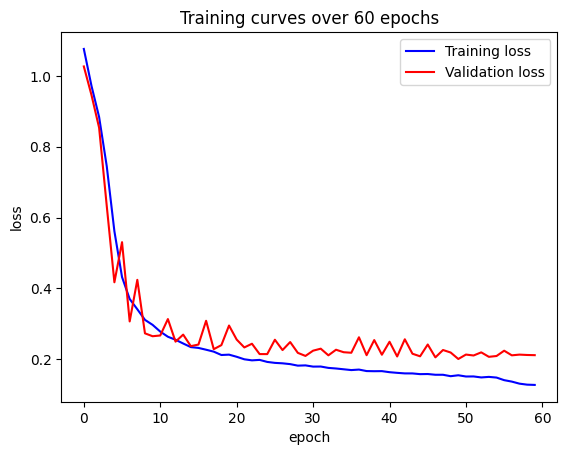

In [4]:
import matplotlib.pyplot as plt
num_training_epochs = 60
plt.plot(range(num_training_epochs),train_loss, color='b', label='Training loss')
plt.plot(range(num_training_epochs),val_loss, color='r', label='Validation loss')
plt.xlabel("epoch")
plt.ylabel("loss")
plt.title(f"Training curves over {num_training_epochs} epochs")
plt.legend()
# plt.savefig(model_prefix+'_training_curve.png')
plt.show()

#### Examining scores for individual samples in the testing set

In [ ]:
pd.set_option('display.max_rows', None)
sample_score_df = pd.concat([pd.DataFrame(sample[1],index=[sample[0]])\
           for sample in sample_test_metrics]
).sort_values(by='dice_avg',ascending=False)
sample_score_df

,dice_et,dice_tc,dice_wt,dice_avg
image_269.npy,0.949025,0.979170,0.958005,0.962067
image_152.npy,0.965454,0.968558,0.949961,0.961324
image_346.npy,0.951192,0.966347,0.963983,0.960507
image_165.npy,0.939709,0.971486,0.940690,0.950628
image_177.npy,0.926051,0.967919,0.955926,0.949965
image_173.npy,0.921143,0.948617,0.974052,0.947937
image_105.npy,0.931029,0.960054,0.949169,0.946751
image_347.npy,0.908911,0.964642,0.965942,0.946499
image_359.npy,0.928009,0.967061,0.933747,0.942939
image_234.npy,0.904859,0.962709,0.960873,0.942814
